# Si cercano hint visivi per la selezione delle variabili
Visto che i metodi parametrici hanno portato a scarsi risultati

In [2]:
#################################
# IMPORT INIZIALE               #
#################################
from utility_scripts.dataframe_extended_class import dataframe_ext
from utility_scripts.manifold_representation import manifold_representation
from sklearn.manifold import TSNE
import seaborn as sns
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import itertools
#lista delle feature in ordine di importanza
rankings = (pd.read_csv("SRANKresults.csv", sep = ";", index_col = [0])
             .sort_values(by = "score_final", ascending = False))
rankings

#import e pulisco il dataset
df = pd.read_csv("../DatasetClientClustering.csv", 
                 engine='c', 
                 sep=',', 
                 encoding='latin-1')
df = df.drop(df.columns[list(np.arange(8))], axis=1)
df = df.drop(columns=["ClientID"])
person_var = ["RiskPropension", "ClientInvestmentHorizon", 
              "ClientKnowledgeExperience", "ClientPotentialIndex",
              "IncomeHighLow", "Sex", "Age", "IncomeNeed", 
              "LongTermCareNeed", "ProtectionNeed",
              "InheritanceIndex", "PanicMood", "NoTrustInBanks", "ClientDateStart"]
dataframe = dataframe_ext(df[person_var]).standardize().clean().df

Feature number:  14 /  14

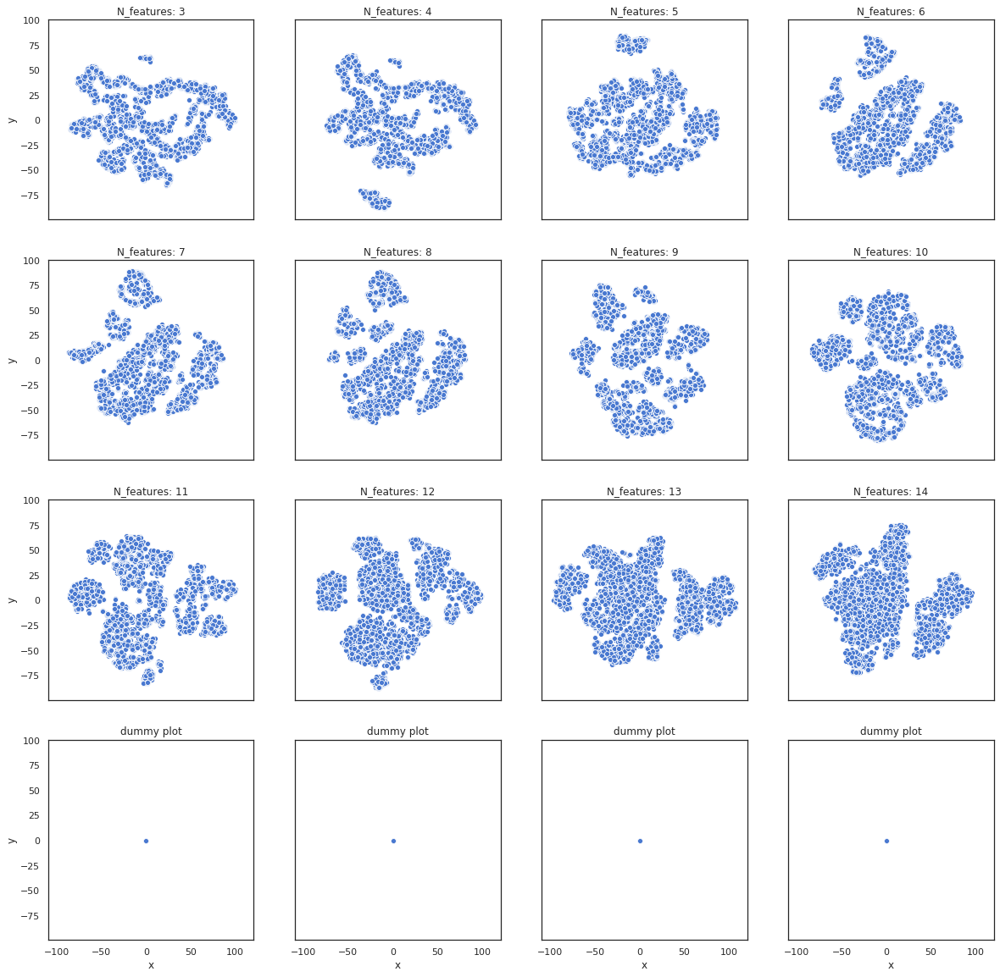

In [4]:
#IN QUESTO CASO SI USANO TUTTE LE VARIABILI SECONDO IL RANKINGS
manifold_representation(dataframe, rankings).manifold_plots()

Feature number:  10 /  10

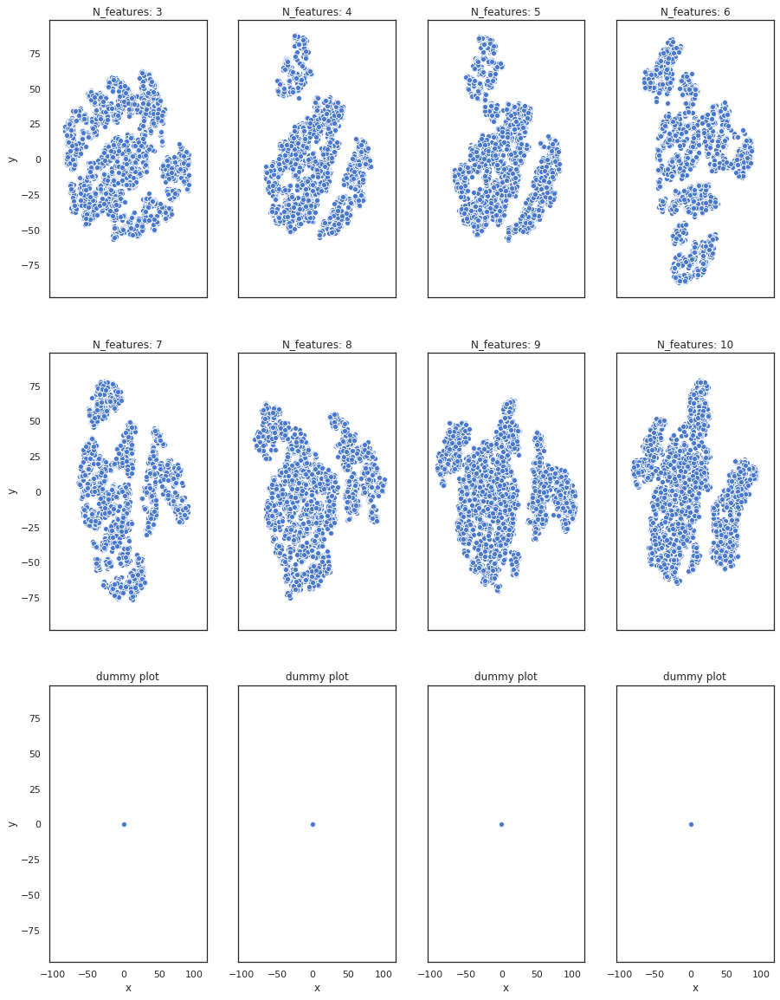

In [3]:
#ORA PROVO A TOGLIERE LE VARIABILI BINARIE
manifold_nobinary = (manifold_representation(dataframe, rankings)
                        .drop_variables(["PanicMood", "Sex", "NoTrustInBanks", "IncomeHighLow"]))
manifold_nobinary.manifold_plots()